# Imports 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ta
import matplotlib as mpl
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
import warnings
warnings.filterwarnings("ignore")
init_notebook_mode(connected=True) 
mpl.style.use('seaborn')
pd.set_option('display.max_columns', 1000)

In [2]:
df=pd.read_csv("AUDUSD_H4.csv")
df.columns = df.columns.str.replace('.','_')
df.head()

,time_local,start_time_local,end_time_local,bid_open,bid_high,bid_low,bid_close,PC2_AUD_H4,PC7_AUD_H4,PC14_AUD_H4,PC20_AUD_H4,PC50_AUD_H4,STDEV_AUD_H4_1p,STDEV_AUD_H4_2p,STDEV_AUD_H4_4p,STDEV_AUD_H4_7p,STDEV_AUD_H4_10p,STDEV_AUD_H4_14p,STDEV_AUD_H4_20p,CS_AUD_CAD_H4_7,correl_AUD_CAD_7p,CS_AUD_CAD_H4_10,correl_AUD_CAD_10p,CS_AUD_CAD_H4_20,correl_AUD_CAD_20p,CS_AUD_CHF_H4_7,correl_AUD_CHF_7p,CS_AUD_CHF_H4_10,correl_AUD_CHF_10p,CS_AUD_CHF_H4_20,correl_AUD_CHF_20p,CS_AUD_GBP_H4_7,correl_AUD_GBP_7p,CS_AUD_GBP_H4_10,correl_AUD_GBP_10p,CS_AUD_GBP_H4_20,correl_AUD_GBP_20p,CS_AUD_JPY_H4_7,correl_AUD_JPY_7p,CS_AUD_JPY_H4_10,correl_AUD_JPY_10p,CS_AUD_JPY_H4_20,correl_AUD_JPY_20p,CS_EUR_AUD_H4_7,correl_EUR_AUD_7p,CS_EUR_AUD_H4_10,correl_EUR_AUD_10p,CS_EUR_AUD_H4_20,correl_EUR_AUD_20p
0,2010-01-05 18:00:00+00:00,1/5/2010 18:00,1/5/2010 22:00,0.9132,0.9153,0.9110,0.9124,-0.31,0.50,1.72,0.0,0.0,0.0004,0.0012,0.0010,0.0020,0.0065,0.0076,0.0,0.706,-0.540,NaN,NaN,NaN,NaN,0.937,-0.538,NaN,NaN,NaN,NaN,-0.571,-0.495,NaN,NaN,NaN,NaN,-0.423,-0.628,NaN,NaN,NaN,NaN,0.953,0.334,NaN,NaN,NaN,NaN
1,2010-01-05 22:00:00+00:00,1/5/2010 22:00,1/6/2010 2:00,0.9123,0.9126,0.9090,0.9117,-0.16,-0.03,1.64,0.0,0.0,0.0004,0.0006,0.0013,0.0011,0.0049,0.0073,0.0,0.848,-0.546,NaN,NaN,NaN,NaN,0.878,-0.657,NaN,NaN,NaN,NaN,-0.735,0.273,NaN,NaN,NaN,NaN,-0.606,-0.307,NaN,NaN,NaN,NaN,0.924,0.744,NaN,NaN,NaN,NaN
2,2010-01-06 02:00:00+00:00,1/6/2010 2:00,1/6/2010 6:00,0.9114,0.9138,0.9102,0.9135,0.12,0.13,1.84,0.0,0.0,0.0009,0.0007,0.0012,0.0011,0.0027,0.0070,0.0,0.894,-0.510,NaN,NaN,NaN,NaN,0.849,-0.627,NaN,NaN,NaN,NaN,-0.727,0.409,NaN,NaN,NaN,NaN,-0.469,-0.137,NaN,NaN,NaN,NaN,0.886,0.622,NaN,NaN,NaN,NaN
3,2010-01-06 06:00:00+00:00,1/6/2010 6:00,1/6/2010 10:00,0.9134,0.9143,0.9123,0.9142,0.27,0.14,1.76,0.0,0.0,0.0004,0.0011,0.0009,0.0011,0.0018,0.0065,0.0,0.915,-0.466,NaN,NaN,NaN,NaN,0.787,-0.433,NaN,NaN,NaN,NaN,-0.719,0.337,NaN,NaN,NaN,NaN,0.014,0.248,NaN,NaN,NaN,NaN,0.813,0.419,NaN,NaN,NaN,NaN
4,2010-01-06 10:00:00+00:00,1/6/2010 10:00,1/6/2010 14:00,0.9140,0.9151,0.9097,0.9142,0.08,-0.01,2.13,0.0,0.0,0.0000,0.0003,0.0010,0.0011,0.0011,0.0059,0.0,0.932,-0.562,NaN,NaN,NaN,NaN,0.690,-0.481,NaN,NaN,NaN,NaN,-0.644,0.421,NaN,NaN,NaN,NaN,0.510,0.545,NaN,NaN,NaN,NaN,0.694,0.405,NaN,NaN,NaN,NaN


In [3]:
df['time_local'] = pd.to_datetime(df['time_local'])

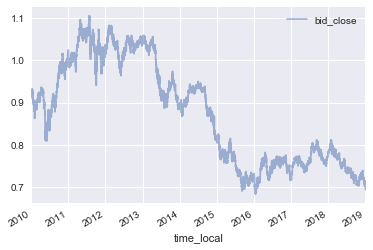

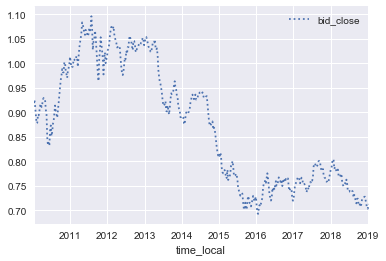

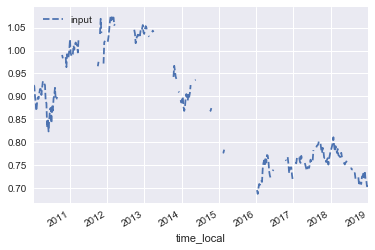

In [4]:
df_selected = df.set_index('time_local')
df_selected = df_selected[['bid_close']]
df_selected.head()

df_selected.plot(alpha=0.5, style='-')
df_selected.resample('W').mean().plot(style=':')
df_selected.asfreq('W').plot(style='--');
plt.legend(['input', 'resample', 'asfreq'],
           loc='upper left');

# Target Variable Creation

## Continuous Targets
- Next Period Lead
- 2 Periods Lead
- 6 Periods Lead

In [5]:
df['target1'] = df['bid_close'].shift(-1)
df['target2'] = df['bid_close'].shift(-2)
df['target3'] = df['bid_close'].shift(-3)

## Classifiction Targets
Difference between corresponding targets

In [6]:
df.loc[df['target1'] - df['bid_close'] < 0, 'class_target1'] = -1
df.loc[df['target1'] - df['bid_close'] > 0, 'class_target1'] = 1
df.loc[df['target1'] - df['bid_close'] == 0, 'class_target1'] = 0


df.loc[df['target2'] - df['bid_close'] < 0, 'class_target2'] = -1
df.loc[df['target2'] - df['bid_close'] > 0, 'class_target2'] = 1
df.loc[df['target2'] - df['bid_close'] == 0, 'class_target2'] = 0

df.loc[df['target3'] - df['bid_close'] < 0, 'class_target3'] = -1
df.loc[df['target3'] - df['bid_close'] > 0, 'class_target3'] = 1
df.loc[df['target3'] - df['bid_close'] == 0, 'class_target3'] = 0


### PCT CHANGE TARGET

In [7]:
df['PC2_AUD_H4_target1'] = ((df['target1']-df['bid_close'])/df['target1'])*100
df['PC2_AUD_H4_target2'] = ((df['target2']-df['bid_close'])/df['target2'])*100
df['PC2_AUD_H4_target3'] = ((df['target3']-df['bid_close'])/df['target3'])*100

In [8]:
for p in np.arange(1, 21, 1) :
    col="bid_close" + str(p) 
    df[col]=df['bid_close'].shift(p)


In [9]:
for p in np.arange(1, 21, 1) :
    col="bid_open" + str(p) 
    df[col]=df['bid_open'].shift(p)

In [10]:
for p in np.arange(1, 21, 1) :
    col="bid_high" + str(p) 
    df[col]=df['bid_high'].shift(p)

In [11]:
for p in np.arange(1, 21, 1) :
    col="bid_low" + str(p) 
    df[col]=df['bid_low'].shift(p)

In [12]:
df.head()

,time_local,start_time_local,end_time_local,bid_open,bid_high,bid_low,bid_close,PC2_AUD_H4,PC7_AUD_H4,PC14_AUD_H4,PC20_AUD_H4,PC50_AUD_H4,STDEV_AUD_H4_1p,STDEV_AUD_H4_2p,STDEV_AUD_H4_4p,STDEV_AUD_H4_7p,STDEV_AUD_H4_10p,STDEV_AUD_H4_14p,STDEV_AUD_H4_20p,CS_AUD_CAD_H4_7,correl_AUD_CAD_7p,CS_AUD_CAD_H4_10,correl_AUD_CAD_10p,CS_AUD_CAD_H4_20,correl_AUD_CAD_20p,CS_AUD_CHF_H4_7,correl_AUD_CHF_7p,CS_AUD_CHF_H4_10,correl_AUD_CHF_10p,CS_AUD_CHF_H4_20,correl_AUD_CHF_20p,CS_AUD_GBP_H4_7,correl_AUD_GBP_7p,CS_AUD_GBP_H4_10,correl_AUD_GBP_10p,CS_AUD_GBP_H4_20,correl_AUD_GBP_20p,CS_AUD_JPY_H4_7,correl_AUD_JPY_7p,CS_AUD_JPY_H4_10,correl_AUD_JPY_10p,CS_AUD_JPY_H4_20,correl_AUD_JPY_20p,CS_EUR_AUD_H4_7,correl_EUR_AUD_7p,CS_EUR_AUD_H4_10,correl_EUR_AUD_10p,CS_EUR_AUD_H4_20,correl_EUR_AUD_20p,target1,target2,target3,class_target1,class_target2,class_target3,PC2_AUD_H4_target1,PC2_AUD_H4_target2,PC2_AUD_H4_target3,bid_close1,bid_close2,bid_close3,bid_close4,bid_close5,bid_close6,bid_close7,bid_close8,bid_close9,bid_close10,bid_close11,bid_close12,bid_close13,bid_close14,bid_close15,bid_close16,bid_close17,bid_close18,bid_close19,bid_close20,bid_open1,bid_open2,bid_open3,bid_open4,bid_open5,bid_open6,bid_open7,bid_open8,bid_open9,bid_open10,bid_open11,bid_open12,bid_open13,bid_open14,bid_open15,bid_open16,bid_open17,bid_open18,bid_open19,bid_open20,bid_high1,bid_high2,bid_high3,bid_high4,bid_high5,bid_high6,bid_high7,bid_high8,bid_high9,bid_high10,bid_high11,bid_high12,bid_high13,bid_high14,bid_high15,bid_high16,bid_high17,bid_high18,bid_high19,bid_high20,bid_low1,bid_low2,bid_low3,bid_low4,bid_low5,bid_low6,bid_low7,bid_low8,bid_low9,bid_low10,bid_low11,bid_low12,bid_low13,bid_low14,bid_low15,bid_low16,bid_low17,bid_low18,bid_low19,bid_low20
0,2010-01-05 18:00:00+00:00,1/5/2010 18:00,1/5/2010 22:00,0.9132,0.9153,0.9110,0.9124,-0.31,0.50,1.72,0.0,0.0,0.0004,0.0012,0.0010,0.0020,0.0065,0.0076,0.0,0.706,-0.540,NaN,NaN,NaN,NaN,0.937,-0.538,NaN,NaN,NaN,NaN,-0.571,-0.495,NaN,NaN,NaN,NaN,-0.423,-0.628,NaN,NaN,NaN,NaN,0.953,0.334,NaN,NaN,NaN,NaN,0.9117,0.9135,0.9142,-1.0,1.0,1.0,-0.076780,0.120416,0.196893,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2010-01-05 22:00:00+00:00,1/5/2010 22:00,1/6/2010 2:00,0.9123,0.9126,0.9090,0.9117,-0.16,-0.03,1.64,0.0,0.0,0.0004,0.0006,0.0013,0.0011,0.0049,0.0073,0.0,0.848,-0.546,NaN,NaN,NaN,NaN,0.878,-0.657,NaN,NaN,NaN,NaN,-0.735,0.273,NaN,NaN,NaN,NaN,-0.606,-0.307,NaN,NaN,NaN,NaN,0.924,0.744,NaN,NaN,NaN,NaN,0.9135,0.9142,0.9142,1.0,1.0,1.0,0.197044,0.273463,0.273463,0.9124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2010-01-06 02:00:00+00:00,1/6/2010 2:00,1/6/2010 6:00,0.9114,0.9138,0.9102,0.9135,0.12,0.13,1.84,0.0,0.0,0.0009,0.0007,0.0012,0.0011,0.0027,0.0070,0.0,0.894,-0.510,NaN,NaN,NaN,NaN,0.849,-0.627,NaN,NaN,NaN,NaN,-0.727,0.409,NaN,NaN,NaN,NaN,-0.469,-0.137,NaN,NaN,NaN,NaN,0.886,0.622,NaN,NaN,NaN,NaN,0.9142,0.9142,0.9156,1.0,1.0,1.0,0.076570,0.076570,0.229358,0.9117,0.9124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9123,0.9132,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9126,0.9153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9090,0.9110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2010-01-06 06:00:00+00:00,1/6/2010 6:00,1/6/2010 10:00,0.9134,0.9143,0.9123,0.9142,0.27,0.14,1.76,0.0,0.0,0.0004,0.0011,0.0009,0.0011,0.0018,0.0065,0.0,0.915,-0.466,NaN,

# Trend Indicators

## Average Directional Movement Index (ADX)

In [13]:
for p in np.arange(1, 21, 1) : 
    col = "TR_ADX_AUD" + str(p) 
    df[col]=ta.trend.adx(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

## Commodity Channel Index (CCI)

In [14]:
for p in np.arange(1, 21, 1) : 
    col = "TR_CCI_AUD" + str(p) 
    df[col]=ta.trend.cci(df['bid_high'], df['bid_low'], df['bid_close'], n=p, c=0.015, fillna=False)


## Detrended Price Oscillator (DPO)

In [15]:
for p in np.arange(1, 21, 1) : 
    col = "TR_DPO_AUD" + str(p) 
    df[col]=ta.trend.dpo(df['bid_close'], n=p,fillna=False)



## Ichimoku Kinkō Hyō (Ichimoku)

In [16]:
'''df['Ichimoku_AUD_a']=ta.trend.ichimoku_a(df['bid_high'], df['bid_low'], n1=4, n2=16, visual=False, fillna=False)
df['Ichimoku_AUD_b']=ta.trend.ichimoku_b(df['bid_high'], df['bid_low'], n2=16, n3=24, visual=False, fillna=False)
plt.plot(df.bid_close)
plt.plot(df.Ichimoku_AUD_a, label='Ichimoku a')
plt.plot(df.Ichimoku_AUD_b, label='Ichimoku b')
plt.title('Ichimoku Kinko Hyo')
plt.legend()
plt.show()'''

"df['Ichimoku_AUD_a']=ta.trend.ichimoku_a(df['bid_high'], df['bid_low'], n1=4, n2=16, visual=False, fillna=False)\ndf['Ichimoku_AUD_b']=ta.trend.ichimoku_b(df['bid_high'], df['bid_low'], n2=16, n3=24, visual=False, fillna=False)\nplt.plot(df.bid_close)\nplt.plot(df.Ichimoku_AUD_a, label='Ichimoku a')\nplt.plot(df.Ichimoku_AUD_b, label='Ichimoku b')\nplt.title('Ichimoku Kinko Hyo')\nplt.legend()\nplt.show()"

## KST Oscillator (KST)

In [17]:
'''df['KST_AUD']=ta.trend.kst(df['bid_close'], r1=4, r2=8, r3=12, r4=16, n1=4, n2=4, n3=4, n4=4, fillna=False)
plt.plot(df.KST_AUD, label='KST')
plt.title('Know Sure Thing (KST)')
plt.legend()
plt.show()'''

"df['KST_AUD']=ta.trend.kst(df['bid_close'], r1=4, r2=8, r3=12, r4=16, n1=4, n2=4, n3=4, n4=4, fillna=False)\nplt.plot(df.KST_AUD, label='KST')\nplt.title('Know Sure Thing (KST)')\nplt.legend()\nplt.show()"

## Moving Average Convergence Divergence (MACD)

In [18]:
'''df['MACD_AUD']=ta.trend.macd(df['bid_close'], n_fast=4, n_slow=20, fillna=False)

plt.plot(df.MACD_AUD, label='MACD')
plt.title('MACD')
plt.legend()
plt.show()'''

"df['MACD_AUD']=ta.trend.macd(df['bid_close'], n_fast=4, n_slow=20, fillna=False)\n\nplt.plot(df.MACD_AUD, label='MACD')\nplt.title('MACD')\nplt.legend()\nplt.show()"

## Mass Index (MI)

In [19]:
#df['MI_AUD']=ta.trend.mass_index(df['bid_high'], df['bid_low'], n=4, n2=20, fillna=False)

## Trix (TRIX)

In [20]:
for p in np.arange(1, 21, 1) : 
    col = "TR_TRIX_AUD" + str(p) 
    df[col]=ta.trend.trix(df['bid_close'], n=p, fillna=False)

## Vortex Indicator (VI)

In [21]:
for p in np.arange(1, 21, 1) : 
    col1= "TR_VI_NEG_AUD" + str(p) 
    col2="TR_VI_POS_AUD" + str(p) 
    df[col1]=ta.trend.vortex_indicator_neg(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)
    df[col2]=ta.trend.vortex_indicator_pos(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

# Momentum Indicators

## Awesome Oscillator

Awesome Oscillator is a 34-period simple moving average, plotted through the central points of the bars (H+L)/2, and subtracted from the 5-period simple moving average, graphed across the central points of the bars (H+L)/2. MEDIAN PRICE = (HIGH+LOW)/2 AO = SMA(MEDIAN PRICE, 5)-SMA(MEDIAN PRICE, 34)

where

SMA — Simple Moving Average.

Parameters:	
- high (pandas.Series) – dataset ‘High’ column.
- low (pandas.Series) – dataset ‘Low’ column.
- s (int) – short period
- l (int) – long period
- fillna (bool) – if True, fill nan values with -50

In [22]:
df['MOM_AO_AUD'] = ta.momentum.ao(df['bid_high'], df['bid_low'], s=5, l=34, fillna=False)

In [23]:
per_week_bid = df.set_index(pd.DatetimeIndex(df['time_local'])).groupby(pd.Grouper(freq='W'))['bid_close'].mean()
per_week_ao = df.set_index(pd.DatetimeIndex(df['time_local'])).groupby(pd.Grouper(freq='W'))['MOM_AO_AUD'].mean()

In [24]:
trace_ao = go.Scatter(
                x=df['time_local'],
                y=df['MOM_AO_AUD'],
                name = "Awesome Oscillator",
                line = dict(color = '#17BECF'),
                opacity = 0.8)

trace_close = go.Scatter(
                x=df['time_local'],
                y=df['bid_close'],
                name = "Bid Close",
                line = dict(color = '#7F7F7F'),
                opacity = 0.8)

data = [trace_ao,trace_close]

layout = dict(
    title = "Time Series with Rangeslider",
        xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
iplot(data, filename = 'ao')

## Money Flow Index (MFI)

Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume
Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

Not using it as it requires **volume** information

## Relative Strength Index (RSI)

\begin{equation*}
RSI (step one) = 100 - [\frac{100}{1+ \frac{Ave Gain}{Ave Loss}}]
\end{equation*}

RSI is that values of 70 or above indicate that a security is becoming overbought or overvalued and may be primed for a trend reversal or corrective pullback in price. An RSI reading of 30 or below indicates an oversold or undervalued condition. More information [here](https://www.investopedia.com/terms/r/rsi.asp)

In [25]:
for p in np.arange(1, 21, 1) : 
    col = "MOM_RSI_AUD" + str(p) 
    df[col]=ta.momentum.rsi(df['bid_close'], n=p, fillna=False)

#df['rsi'] = ta.momentum.rsi(df['bid_close'], n=14, fillna=False)

In [26]:
## Stochastic Oscillator

\begin{equation*}
K = 100 - (\frac{C - L14}{H14-L14} * 100)
\end{equation*}

Where:

- C = the most recent closing price;

- L14 = the lowest price traded of the 14 previous trading sessions;

- H14 = the highest price traded during the same 14-day period; and

- %K = the current value of the stochastic indicator.

- %K is referred to sometimes as the slow stochastic indicator. The "fast" stochastic indicator is taken as %D = 3-period moving average of %K

For more information refer [link](https://www.investopedia.com/terms/s/stochasticoscillator.asp)

In [27]:
for p in np.arange(1, 21, 1) : 
    col = "MOM_STOCH_OSCILLATOR_AUD" + str(p) 
    df[col]=ta.momentum.stoch(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

#df['stoch_oscillator'] = ta.momentum.stoch(df['bid_high'], df['bid_low'], df['bid_close'], n=14, fillna=False)

In [28]:
trace_rsi = go.Scatter(
                x=df['time_local'],
                y=df['MOM_RSI_AUD1'],
                name = "RSI",
                line = dict(color = '#17BECF'),
                opacity = 0.8)

trace_stochastic_oscillator = go.Scatter(
                x=df['time_local'],
                y=df['MOM_STOCH_OSCILLATOR_AUD1'],
                name = 'stoch_oscillator',
                line = dict(color = '#7F7F7F'),
                opacity = 0.8)

data = [trace_rsi,trace_stochastic_oscillator]

layout = dict(
    title = "Time Series with Rangeslider",
        xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
iplot(data, filename = 'Stoch Vs RSI')

## Stochastic Oscillator Signal

- high (pandas.Series) – dataset ‘High’ column.
- low (pandas.Series) – dataset ‘Low’ column.
- close (pandas.Series) – dataset ‘Close’ column.
- n (int) – n period.
- d_n (int) – sma period over stoch_k
- fillna (bool) – if True, fill nan values.

In [29]:
for p in np.arange(1, 21, 1) : 
    col = "MOM_STOCH_OSCILLATOR_SIGNAL_AUD" + str(p) 
    df[col]=ta.momentum.stoch_signal(df['bid_high'], df['bid_low'], df['bid_close'], n=p, d_n=3, fillna=False)


#df['stoch_oscillator_signal'] =ta.momentum.stoch_signal(df['bid_high'], df['bid_low'], df['bid_close'], n=14, d_n=3, fillna=False)

In [30]:
trace_stochastic_oscillator_signal = go.Scatter(
                x=df['time_local'],
                y=df['MOM_STOCH_OSCILLATOR_SIGNAL_AUD1'],
                name = 'stoch_oscillator_signal',
                line = dict(color = '#17BECF'),
                opacity = 0.5)

data = [trace_stochastic_oscillator_signal,trace_stochastic_oscillator]

layout = dict(
    title = "Time Series with Rangeslider",
        xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label='1m',
                     step='month',
                     stepmode='backward'),
                dict(count=6,
                     label='6m',
                     step='month',
                     stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(
            visible = True
        ),
        type='date'
    )
)

fig = dict(data=data, layout=layout)
iplot(data, filename = 'Stoch Vs Stoch_Signal')

## True Strength Indicator

\begin{equation*}
{\displaystyle TSI(c_{0},r,s)=100{\frac {EMA(EMA(m,r),s)}{EMA(EMA(|m|,r),s)}}}
\end{equation*}
where

- c0 = today's closing price
- m = c0 − c1 = momentum (difference between today's and yesterday's close)
- EMA(m,n) = exponential moving average of m over n periods, that is,
- \begin{equation*} {\displaystyle EMA(m_{0},n)={\frac {2}{n+1}}\left[m_{0}-EMA(m_{1},n)\right]+EMA(m_{1},n)} {\displaystyle EMA(m_{0},n)={\frac {2}{n+1}}\left[m_{0}-EMA(m_{1},n)\right]+EMA(m_{1},n)}
\end{equation*}
- r = EMA smoothing period for momentum, typically 25
- s = EMA smoothing period for smoothed momentum, typically 13

While the TSI output is bound between +100 and −100, most values fall between +25 and −25

In [31]:
df['MOM_TSI_AUD'] = ta.momentum.tsi(df['bid_close'], r=25, s=13, fillna=False)

## Utlimate Oscillator

- BP = Close - Minimum(Low or Prior Close)
- TR = Maximum(High or Prior Close) - Minimum(Low or Prior Close) 
- Average7 = (7-period BP Sum) / (7-period TR Sum) 
- Average14 = (14-period BP Sum) / (14-period TR Sum) Average28 = (28-period BP Sum) / (28-period TR Sum)

\begin{equation*}
UO = 100 * \frac{[(4 * Average7)+(2 * Average14) + Average28]}{(4+2+1)}
\end{equation*}

- high (pandas.Series) – dataset ‘High’ column.
- low (pandas.Series) – dataset ‘Low’ column.
- close (pandas.Series) – dataset ‘Close’ column.
- s (int) – short period
- m (int) – medium period
- l (int) – long period
- ws (float) – weight of short BP average for UO
- wm (float) – weight of medium BP average for UO
- wl (float) – weight of long BP average for UO
- fillna (bool) – if True, fill nan values with 50.

In [32]:
df['MOM_UO_AUD'] = ta.momentum.uo(df['bid_high'], df['bid_low'], df['bid_close'],
                          s=7, m=14, l=28, ws=4.0, wm=2.0, wl=1.0, fillna=False)


## Williams %R

\begin{equation*}
R = \frac{(Highest High - Close)}{(Highest High - Lowest Low)} * -100
\end{equation*}
The Williams %R oscillates from 0 to -100. When the indicator produces readings from 0 to -20, this indicates overbought market conditions. When readings are -80 to -100, it indicates oversold market conditions.

In [33]:
df['MOM_WR_AUD']= ta.momentum.wr(df['bid_high'],df['bid_low'], df['bid_close'], lbp=14, fillna=False)

In [34]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_ATR_AUD" + str(p) 
    df[col]=ta.volatility.average_true_range(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

In [35]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_BOLLINGER_BANDS_AUD" + str(p) 
    df[col]=ta.volatility.bollinger_hband(df['bid_close'], n=p, ndev=2, fillna=False)


In [36]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_BOLLINGER_H_BANDS_AUD" + str(p) 
    df[col]=ta.volatility.bollinger_hband_indicator(df['bid_close'], n=p, ndev=2, fillna=False)

In [37]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_BOLLINGER_L_BANDS_AUD" + str(p) 
    df[col]=ta.volatility.bollinger_lband(df['bid_close'], n=p, ndev=2, fillna=False)


In [39]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_BOLLINGER_L_BANDS_INDICATOR_AUD" + str(p) 
    df[col]=ta.volatility.bollinger_lband_indicator(df['bid_close'], n=p, ndev=2, fillna=False)


In [40]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_BOLLINGER_MAVG_AUD" + str(p) 
    df[col]=ta.volatility.bollinger_mavg(df['bid_close'], n=p, fillna=False)

In [41]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_DONCHAIN_CHANNEL_H_BAND_AUD" + str(p) 
    df[col]=ta.volatility.donchian_channel_hband(df['bid_close'], n=p, fillna=False)

In [42]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD" + str(p) 
    df[col]=ta.volatility.donchian_channel_hband_indicator(df['bid_close'], n=p, fillna=False)

In [43]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_DONCHAIN_CHANNEL_L_BAND_AUD" + str(p) 
    df[col]=ta.volatility.donchian_channel_lband(df['bid_close'], n=p, fillna=False)

In [44]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD" + str(p) 
    df[col]=ta.volatility.donchian_channel_lband_indicator(df['bid_close'], n=p, fillna=False)

In [45]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_KELTNER_CHANNEL_CENTRAL_AUD" + str(p) 
    df[col]=ta.volatility.keltner_channel_central(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

In [46]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_KELTNER_CHANNEL_H_BAND_AUD" + str(p) 
    df[col]=ta.volatility.keltner_channel_hband(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

In [47]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_KELTNER_CHANNEL_H_BAND_INDICATOR_AUD" + str(p) 
    df[col]=ta.volatility.keltner_channel_hband_indicator(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

In [48]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_KELTNER_CHANNEL_L_BAND_AUD" + str(p) 
    df[col]=ta.volatility.keltner_channel_lband(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

In [49]:
for p in np.arange(1, 21, 1) : 
    col = "VOL_KELTNER_CHANNEL_L_BAND_INDICATOR_AUD" + str(p) 
    df[col]=ta.volatility.keltner_channel_lband_indicator(df['bid_high'], df['bid_low'], df['bid_close'], n=p, fillna=False)

In [50]:
df.shape

(15269, 642)

In [51]:
df.to_csv("forex_dataframe.csv",index=False)

In [52]:
df=pd.read_csv("forex_dataframe.csv")

## EDA

In [53]:
df['year']=pd.DatetimeIndex(df['time_local']).year
df['month']=pd.DatetimeIndex(df['time_local']).month
df['day']=pd.DatetimeIndex(df['time_local']).day

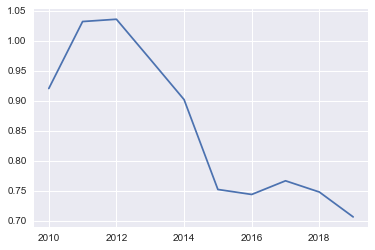

In [54]:
yearly_mean=df.groupby(['year'])['bid_close'].mean().reset_index()
plt.plot(yearly_mean['year'],yearly_mean['bid_close'])

In [55]:
#df=df.drop(['Unnamed: 0'],axis=1)
df.head()

,time_local,start_time_local,end_time_local,bid_open,bid_high,bid_low,bid_close,PC2_AUD_H4,PC7_AUD_H4,PC14_AUD_H4,PC20_AUD_H4,PC50_AUD_H4,STDEV_AUD_H4_1p,STDEV_AUD_H4_2p,STDEV_AUD_H4_4p,STDEV_AUD_H4_7p,STDEV_AUD_H4_10p,STDEV_AUD_H4_14p,STDEV_AUD_H4_20p,CS_AUD_CAD_H4_7,correl_AUD_CAD_7p,CS_AUD_CAD_H4_10,correl_AUD_CAD_10p,CS_AUD_CAD_H4_20,correl_AUD_CAD_20p,CS_AUD_CHF_H4_7,correl_AUD_CHF_7p,CS_AUD_CHF_H4_10,correl_AUD_CHF_10p,CS_AUD_CHF_H4_20,correl_AUD_CHF_20p,CS_AUD_GBP_H4_7,correl_AUD_GBP_7p,CS_AUD_GBP_H4_10,correl_AUD_GBP_10p,CS_AUD_GBP_H4_20,correl_AUD_GBP_20p,CS_AUD_JPY_H4_7,correl_AUD_JPY_7p,CS_AUD_JPY_H4_10,correl_AUD_JPY_10p,CS_AUD_JPY_H4_20,correl_AUD_JPY_20p,CS_EUR_AUD_H4_7,correl_EUR_AUD_7p,CS_EUR_AUD_H4_10,correl_EUR_AUD_10p,CS_EUR_AUD_H4_20,correl_EUR_AUD_20p,target1,target2,target3,class_target1,class_target2,class_target3,PC2_AUD_H4_target1,PC2_AUD_H4_target2,PC2_AUD_H4_target3,bid_close1,bid_close2,bid_close3,bid_close4,bid_close5,bid_close6,bid_close7,bid_close8,bid_close9,bid_close10,bid_close11,bid_close12,bid_close13,bid_close14,bid_close15,bid_close16,bid_close17,bid_close18,bid_close19,bid_close20,bid_open1,bid_open2,bid_open3,bid_open4,bid_open5,bid_open6,bid_open7,bid_open8,bid_open9,bid_open10,bid_open11,bid_open12,bid_open13,bid_open14,bid_open15,bid_open16,bid_open17,bid_open18,bid_open19,bid_open20,bid_high1,bid_high2,bid_high3,bid_high4,bid_high5,bid_high6,bid_high7,bid_high8,bid_high9,bid_high10,bid_high11,bid_high12,bid_high13,bid_high14,bid_high15,bid_high16,bid_high17,bid_high18,bid_high19,bid_high20,bid_low1,bid_low2,bid_low3,bid_low4,bid_low5,bid_low6,bid_low7,bid_low8,bid_low9,bid_low10,bid_low11,bid_low12,bid_low13,bid_low14,bid_low15,bid_low16,bid_low17,bid_low18,bid_low19,bid_low20,TR_ADX_AUD1,TR_ADX_AUD2,TR_ADX_AUD3,TR_ADX_AUD4,TR_ADX_AUD5,TR_ADX_AUD6,TR_ADX_AUD7,TR_ADX_AUD8,TR_ADX_AUD9,TR_ADX_AUD10,TR_ADX_AUD11,TR_ADX_AUD12,TR_ADX_AUD13,TR_ADX_AUD14,TR_ADX_AUD15,TR_ADX_AUD16,TR_ADX_AUD17,TR_ADX_AUD18,TR_ADX_AUD19,TR_ADX_AUD20,TR_CCI_AUD1,TR_CCI_AUD2,TR_CCI_AUD3,TR_CCI_AUD4,TR_CCI_AUD5,TR_CCI_AUD6,TR_CCI_AUD7,TR_CCI_AUD8,TR_CCI_AUD9,TR_CCI_AUD10,TR_CCI_AUD11,TR_CCI_AUD12,TR_CCI_AUD13,TR_CCI_AUD14,TR_CCI_AUD15,TR_CCI_AUD16,TR_CCI_AUD17,TR_CCI_AUD18,TR_CCI_AUD19,TR_CCI_AUD20,TR_DPO_AUD1,TR_DPO_AUD2,TR_DPO_AUD3,TR_DPO_AUD4,TR_DPO_AUD5,TR_DPO_AUD6,TR_DPO_AUD7,TR_DPO_AUD8,TR_DPO_AUD9,TR_DPO_AUD10,TR_DPO_AUD11,TR_DPO_AUD12,TR_DPO_AUD13,TR_DPO_AUD14,TR_DPO_AUD15,TR_DPO_AUD16,TR_DPO_AUD17,TR_DPO_AUD18,TR_DPO_AUD19,TR_DPO_AUD20,TR_TRIX_AUD1,TR_TRIX_AUD2,TR_TRIX_AUD3,TR_TRIX_AUD4,TR_TRIX_AUD5,TR_TRIX_AUD6,TR_TRIX_AUD7,TR_TRIX_AUD8,TR_TRIX_AUD9,TR_TRIX_AUD10,TR_TRIX_AUD11,TR_TRIX_AUD12,TR_TRIX_AUD13,TR_TRIX_AUD14,TR_TRIX_AUD15,TR_TRIX_AUD16,TR_TRIX_AUD17,TR_TRIX_AUD18,TR_TRIX_AUD19,TR_TRIX_AUD20,TR_VI_NEG_AUD1,TR_VI_POS_AUD1,TR_VI_NEG_AUD2,TR_VI_POS_AUD2,TR_VI_NEG_AUD3,TR_VI_POS_AUD3,TR_VI_NEG_AUD4,TR_VI_POS_AUD4,TR_VI_NEG_AUD5,TR_VI_POS_AUD5,TR_VI_NEG_AUD6,TR_VI_POS_AUD6,TR_VI_NEG_AUD7,TR_VI_POS_AUD7,TR_VI_NEG_AUD8,TR_VI_POS_AUD8,TR_VI_NEG_AUD9,TR_VI_POS_AUD9,TR_VI_NEG_AUD10,TR_VI_POS_AUD10,TR_VI_NEG_AUD11,TR_VI_POS_AUD11,TR_VI_NEG_AUD12,TR_VI_POS_AUD12,TR_VI_NEG_AUD13,TR_VI_POS_AUD13,TR_VI_NEG_AUD14,TR_VI_POS_AUD14,TR_VI_NEG_AUD15,TR_VI_POS_AUD15,TR_VI_NEG_AUD16,TR_VI_POS_AUD16,TR_VI_NEG_AUD17,TR_VI_POS_AUD17,TR_VI_NEG_AUD18,TR_VI_POS_AUD18,TR_VI_NEG_AUD19,TR_VI_POS_AUD19,TR_VI_NEG_AUD20,TR_VI_POS_AUD20,MOM_AO_AUD,MOM_RSI_AUD1,MOM_RSI_AUD2,MOM_RSI_AUD3,MOM_RSI_AUD4,MOM_RSI_AUD5,MOM_RSI_AUD6,MOM_RSI_AUD7,MOM_RSI_AUD8,MOM_RSI_AUD9,MOM_RSI_AUD10,MOM_RSI_AUD11,MOM_RSI_AUD12,MOM_RSI_AUD13,MOM_RSI_AUD14,MOM_RSI_AUD15,MOM_RSI_AUD16,MOM_RSI_AUD17,MOM_RSI_AUD18,MOM_RSI_AUD19,MOM_RSI_AUD20,MOM_STOCH_OSCILLATOR_AUD1,MOM_STOCH_OSCILLATOR_AUD2,MOM_STOCH_OSCILLATOR_AUD3,MOM_STOCH_OSCILLATOR_AUD4,MOM_STOCH_OSCILLATOR_AUD5,MOM_STOCH_OSCILLATOR_AUD6,MOM_STOCH_OSCILLATOR_AUD7,MOM_STOCH_OSCILLATOR_AUD8,MOM_STOCH_OSCILLATOR_AUD9,MOM_STOCH_OSCILLATOR_AUD10,MOM_STOCH_OSCILLATOR_AUD11,MOM_STOCH_OSCILLATOR_AUD12,MOM_STO

In [56]:
df_forex_1=df[['time_local','start_time_local','end_time_local','bid_open','bid_high','bid_low','bid_close']]

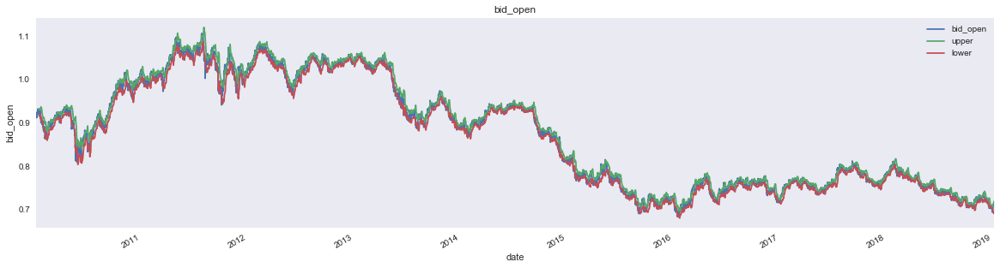

In [57]:
# calculate Simple Moving Average with 20 hr window

sma = df_forex_1['bid_open'].rolling(window=48).mean()

# calculate the standar deviation
rstd = df_forex_1['bid_open'].rolling(window=20).std()

upper_band = sma + 2 * rstd
#upper_band = upper_band.rename(columns='upper')
lower_band = sma - 2 * rstd
#lower_band = lower_band.rename(columns='lower')
df_forex_1['upper']=upper_band
df_forex_1['lower']=lower_band
df_new = df_forex_1[['start_time_local','bid_open','upper','lower']]
df_new['start_time_local'] =  pd.to_datetime(df['start_time_local'])
df_new.set_index('start_time_local',inplace=True)

ax = df_new.plot(title='bid_open',figsize=(20,5))

#date_fmt = '%Y-%m-%d %H:%M:%S'
#formatter = dates.DateFormatter(date_fmt)
#ax.xaxis.set_major_formatter(formatter)

ax.fill_between(df_new.index, df_new['lower'], df_new['upper'], color='#ADCCFF', alpha='0.4')
ax.set_xlabel('date')
ax.set_ylabel('bid_open')
ax.grid()
plt.show()

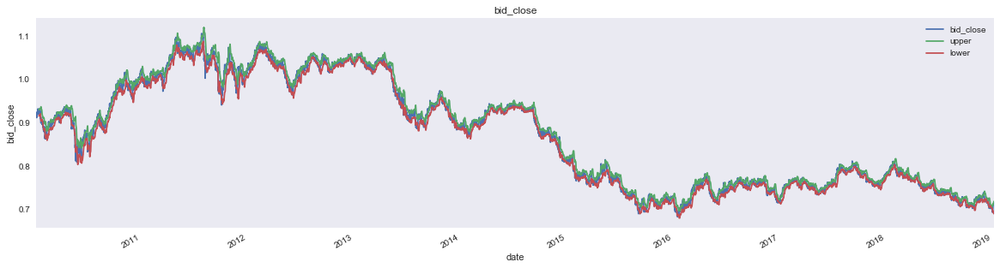

In [58]:
# calculate Simple Moving Average with 20 hr window

sma = df_forex_1['bid_close'].rolling(window=48).mean()

# calculate the standar deviation
rstd = df_forex_1['bid_close'].rolling(window=20).std()

upper_band = sma + 2 * rstd
#upper_band = upper_band.rename(columns='upper')
lower_band = sma - 2 * rstd
#lower_band = lower_band.rename(columns='lower')
df_forex_1['upper']=upper_band
df_forex_1['lower']=lower_band
df_new = df_forex_1[['start_time_local','bid_close','upper','lower']]
df_new['start_time_local'] =  pd.to_datetime(df['start_time_local'])
df_new.set_index('start_time_local',inplace=True)

ax = df_new.plot(title='bid_close',figsize=(20,5))

#date_fmt = '%Y-%m-%d %H:%M:%S'
#formatter = dates.DateFormatter(date_fmt)
#ax.xaxis.set_major_formatter(formatter)

ax.fill_between(df_new.index, df_new['lower'], df_new['upper'], color='#ADCCFF', alpha='0.4')
ax.set_xlabel('date')
ax.set_ylabel('bid_close')
ax.grid()
plt.show()

In [59]:
import plotly.graph_objs as go
trace = go.Ohlc(x=df_forex_1['start_time_local'],
                open=df_forex_1['bid_open'],
                high=df_forex_1['bid_high'],
                low=df_forex_1['bid_low'],
                close=df_forex_1['bid_close'])
data = [trace]
iplot(data)

In [60]:
import plotly.plotly as py
import plotly.graph_objs as go

import numpy as np

y0 = df_forex_1['bid_open']
y1 = df_forex_1['bid_close']
y2 = df_forex_1['bid_high']
y3 = df_forex_1['bid_low']

bid_open = go.Box(
    y=y0,
    name = 'BID_OPEN'
)
bid_close = go.Box(
    y=y1,
    name = 'BID_CLOSE'
)
bid_high = go.Box(
    y=y2,
    name = 'BID_HIGH'
)
bid_low = go.Box(
    y=y3,
    name = 'BID_LOW'
)
data = [bid_open, bid_close,bid_high,bid_low]
iplot(data)

In [61]:
df_forex_1['year']=pd.DatetimeIndex(df_forex_1['time_local']).year
df_forex_1['month']=pd.DatetimeIndex(df_forex_1['time_local']).month
df_forex_1['day']=pd.DatetimeIndex(df_forex_1['time_local']).day

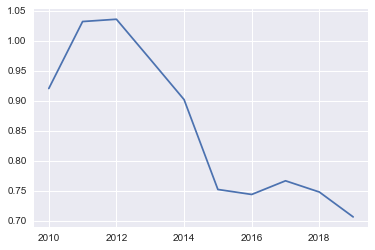

In [62]:
yearly_mean=df_forex_1.groupby(['year'])['bid_close'].mean().reset_index()
plt.plot(yearly_mean['year'],yearly_mean['bid_close'])

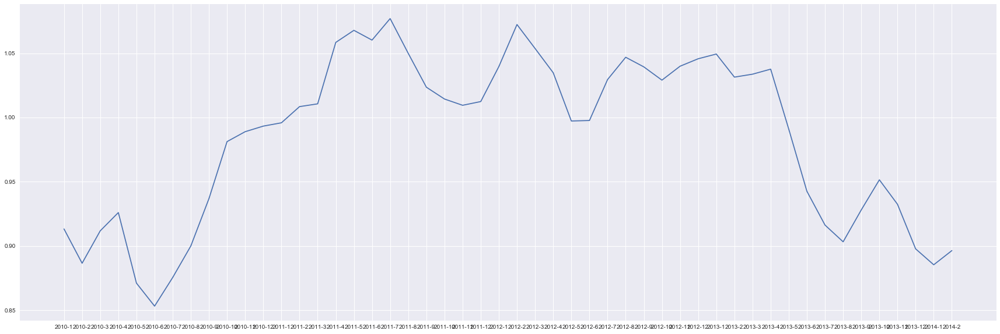

In [63]:
monthly_mean=df_forex_1.groupby(['year','month'])['bid_close'].mean().reset_index()
monthly_mean['concat_year_month']=monthly_mean['year'].map(str)+'-'+ monthly_mean['month'].map(str)
plt.figure(figsize=(30,10))
plt.plot(monthly_mean['concat_year_month'].head(50),monthly_mean['bid_close'].head(50))
plt.show()

In [64]:
df_year_2010=df[df['year']==2010]
df_year_2011=df[df['year']==2011]
df_year_2012=df[df['year']==2012]
df_year_2013=df[df['year']==2013]
df_year_2014=df[df['year']==2014]
df_year_2015=df[df['year']==2015]
df_year_2016=df[df['year']==2016]
df_year_2017=df[df['year']==2017]
df_year_2018=df[df['year']==2018]

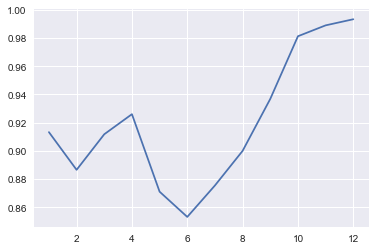

In [65]:
yearly_mean_2010=df_year_2010.groupby(['month'])['bid_close'].mean().reset_index()
plt.plot(yearly_mean_2010['month'],yearly_mean_2010['bid_close'])

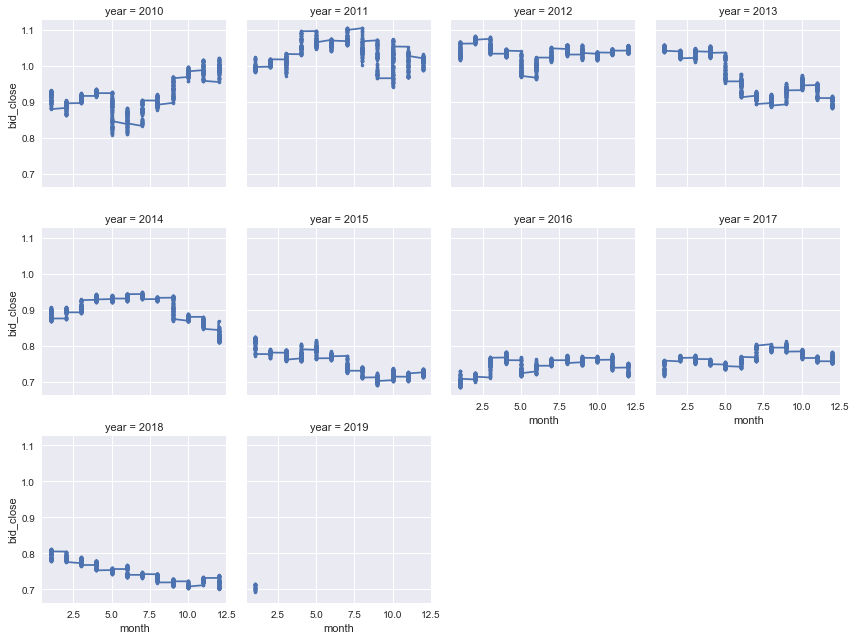

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns
g = sns.FacetGrid(df, col="year",col_wrap=4)
g = g.map(plt.plot, "month", "bid_close", marker=".")

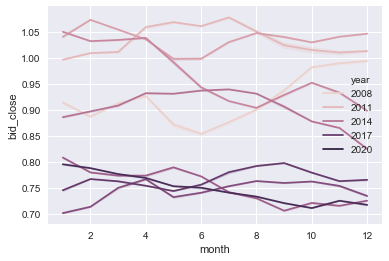

In [67]:
import seaborn as sns
sns.lineplot(x='month',y='bid_close',hue='year',data=df_forex_1)

In [68]:
'''
new_df =df_forex_1[['time_local','bid_close']]
new_df=new_df.T.reset_index(drop=True)
new_df.columns = new_df.iloc[0]
new_df = new_df.iloc[1:]
new_df=new_df.fillna(0)
new_df

fig, ax = plt.subplots(figsize=(12,24))
sns.heatmap(new_df,ax=ax)
plt.show()
'''

"\nnew_df =df_forex_1[['time_local','bid_close']]\nnew_df=new_df.T.reset_index(drop=True)\nnew_df.columns = new_df.iloc[0]\nnew_df = new_df.iloc[1:]\nnew_df=new_df.fillna(0)\nnew_df\n\nfig, ax = plt.subplots(figsize=(12,24))\nsns.heatmap(new_df,ax=ax)\nplt.show()\n"

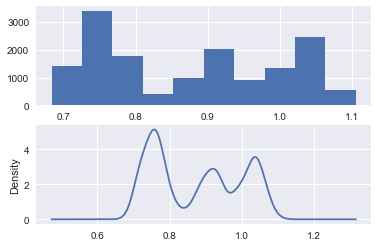

In [69]:
from pandas import Series
from matplotlib import pyplot
series = df_forex_1['bid_close']
pyplot.figure(1)
pyplot.subplot(211)
series.hist()
pyplot.subplot(212)
series.plot(kind='kde')
pyplot.show()

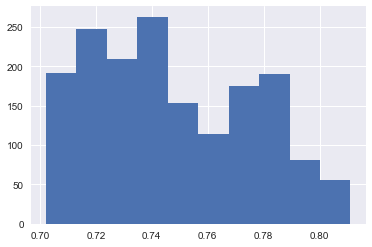

In [70]:
(df_year_2018['target1']).hist()

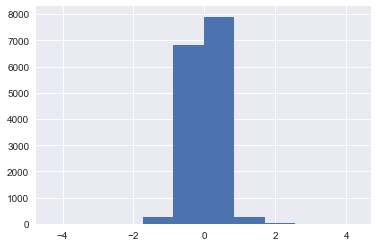

In [71]:
df['PC2_AUD_H4'].hist()

# Feature selection through Correlation

In [72]:
corr=df.corr()

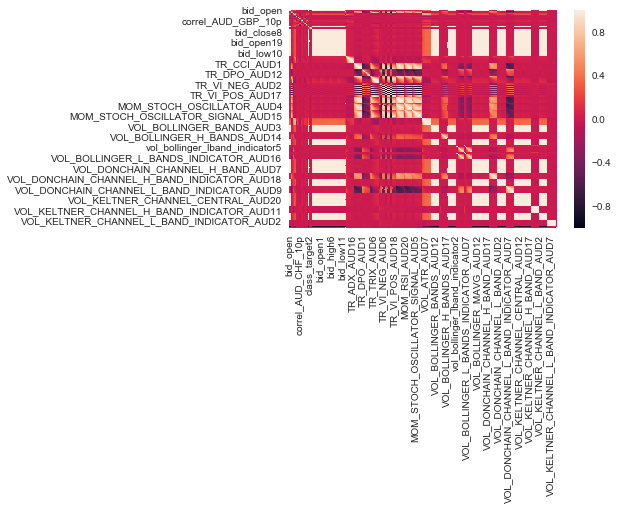

In [73]:
sns.heatmap(corr)

In [75]:
df1=df.drop(columns=['time_local','start_time_local','end_time_local'],axis=1)

In [76]:
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.9:
            if columns[j]:
                columns[j] = False
selected_columns = df1.columns[columns]
data = df1[selected_columns]

In [77]:
len(data.columns)

137

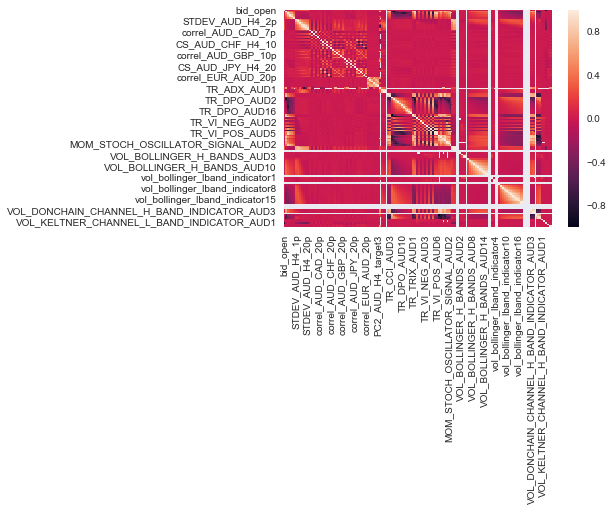

In [78]:
sns.heatmap(data.corr())

In [83]:
data[['target1','target2','target3']]=df[['target1','target2','target3']]

In [84]:
data.head()

,bid_open,PC2_AUD_H4,PC7_AUD_H4,PC14_AUD_H4,PC20_AUD_H4,PC50_AUD_H4,STDEV_AUD_H4_1p,STDEV_AUD_H4_2p,STDEV_AUD_H4_4p,STDEV_AUD_H4_7p,STDEV_AUD_H4_10p,STDEV_AUD_H4_14p,STDEV_AUD_H4_20p,CS_AUD_CAD_H4_7,correl_AUD_CAD_7p,CS_AUD_CAD_H4_10,correl_AUD_CAD_10p,CS_AUD_CAD_H4_20,correl_AUD_CAD_20p,CS_AUD_CHF_H4_7,correl_AUD_CHF_7p,CS_AUD_CHF_H4_10,correl_AUD_CHF_10p,CS_AUD_CHF_H4_20,correl_AUD_CHF_20p,CS_AUD_GBP_H4_7,correl_AUD_GBP_7p,CS_AUD_GBP_H4_10,correl_AUD_GBP_10p,CS_AUD_GBP_H4_20,correl_AUD_GBP_20p,CS_AUD_JPY_H4_7,correl_AUD_JPY_7p,CS_AUD_JPY_H4_10,correl_AUD_JPY_10p,CS_AUD_JPY_H4_20,correl_AUD_JPY_20p,CS_EUR_AUD_H4_7,correl_EUR_AUD_7p,CS_EUR_AUD_H4_10,correl_EUR_AUD_10p,CS_EUR_AUD_H4_20,correl_EUR_AUD_20p,class_target1,class_target2,class_target3,PC2_AUD_H4_target1,PC2_AUD_H4_target2,PC2_AUD_H4_target3,TR_ADX_AUD1,TR_ADX_AUD2,TR_ADX_AUD3,TR_CCI_AUD1,TR_CCI_AUD2,TR_CCI_AUD3,TR_DPO_AUD1,TR_DPO_AUD2,TR_DPO_AUD4,TR_DPO_AUD6,TR_DPO_AUD8,TR_DPO_AUD10,TR_DPO_AUD12,TR_DPO_AUD14,TR_DPO_AUD16,TR_DPO_AUD18,TR_DPO_AUD20,TR_TRIX_AUD1,TR_TRIX_AUD2,TR_VI_NEG_AUD1,TR_VI_POS_AUD1,TR_VI_NEG_AUD2,TR_VI_POS_AUD2,TR_VI_NEG_AUD3,TR_VI_POS_AUD3,TR_VI_NEG_AUD4,TR_VI_POS_AUD4,TR_VI_NEG_AUD5,TR_VI_POS_AUD5,TR_VI_POS_AUD6,MOM_RSI_AUD1,MOM_RSI_AUD2,MOM_STOCH_OSCILLATOR_AUD1,MOM_STOCH_OSCILLATOR_AUD2,MOM_STOCH_OSCILLATOR_SIGNAL_AUD1,MOM_STOCH_OSCILLATOR_SIGNAL_AUD2,MOM_UO_AUD,VOL_ATR_AUD1,VOL_ATR_AUD2,VOL_BOLLINGER_BANDS_AUD1,VOL_BOLLINGER_H_BANDS_AUD1,VOL_BOLLINGER_H_BANDS_AUD2,VOL_BOLLINGER_H_BANDS_AUD3,VOL_BOLLINGER_H_BANDS_AUD4,VOL_BOLLINGER_H_BANDS_AUD5,VOL_BOLLINGER_H_BANDS_AUD6,VOL_BOLLINGER_H_BANDS_AUD7,VOL_BOLLINGER_H_BANDS_AUD8,VOL_BOLLINGER_H_BANDS_AUD9,VOL_BOLLINGER_H_BANDS_AUD10,VOL_BOLLINGER_H_BANDS_AUD11,VOL_BOLLINGER_H_BANDS_AUD12,VOL_BOLLINGER_H_BANDS_AUD13,VOL_BOLLINGER_H_BANDS_AUD14,VOL_BOLLINGER_H_BANDS_AUD15,VOL_BOLLINGER_L_BANDS_AUD1,vol_bollinger_lband_indicator1,vol_bollinger_lband_indicator2,vol_bollinger_lband_indicator3,vol_bollinger_lband_indicator4,vol_bollinger_lband_indicator5,vol_bollinger_lband_indicator6,vol_bollinger_lband_indicator7,vol_bollinger_lband_indicator8,vol_bollinger_lband_indicator9,vol_bollinger_lband_indicator10,vol_bollinger_lband_indicator11,vol_bollinger_lband_indicator12,vol_bollinger_lband_indicator13,vol_bollinger_lband_indicator14,vol_bollinger_lband_indicator15,vol_bollinger_lband_indicator16,vol_bollinger_lband_indicator19,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD1,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD4,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD5,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD1,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD3,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD4,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD1,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD2,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD3,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD4,VOL_KELTNER_CHANNEL_H_BAND_INDICATOR_AUD1,VOL_KELTNER_CHANNEL_L_BAND_INDICATOR_AUD1,year,month,day,target1,target2,target3
0,0.9132,-0.31,0.50,1.72,0.0,0.0,0.0004,0.0012,0.0010,0.0020,0.0065,0.0076,0.0,0.706,-0.540,NaN,NaN,NaN,NaN,0.937,-0.538,NaN,NaN,NaN,NaN,-0.571,-0.495,NaN,NaN,NaN,NaN,-0.423,-0.628,NaN,NaN,NaN,NaN,0.953,0.334,NaN,NaN,NaN,NaN,-1.0,1.0,1.0,-0.076780,0.120416,0.196893,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32.558140,NaN,NaN,NaN,NaN,0.003669,0.003669,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2010,1,5,0.9117,0.9135,0.9142
1,0.9123,-0.16,-0.03,1.64,0.0,0.0,0.0004,0.0006,0.0013,0.0011,0.0049,0.0073,0.0,0.848,-0.546,NaN,NaN,NaN,NaN,0.878,-0.657,NaN,NaN,NaN,NaN,-0.735,0.273,NaN,NaN,NaN,NaN,-0.606,-0.307,NaN,NaN,NaN,NaN,0.924,0.744,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.197044,0.273463,0.273463,100.0,0.000000,0.0,NaN,-47.140452,NaN,7.000000e-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.076721,NaN,1.750000,0.444444,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


ValueError: cannot convert float NaN to integer

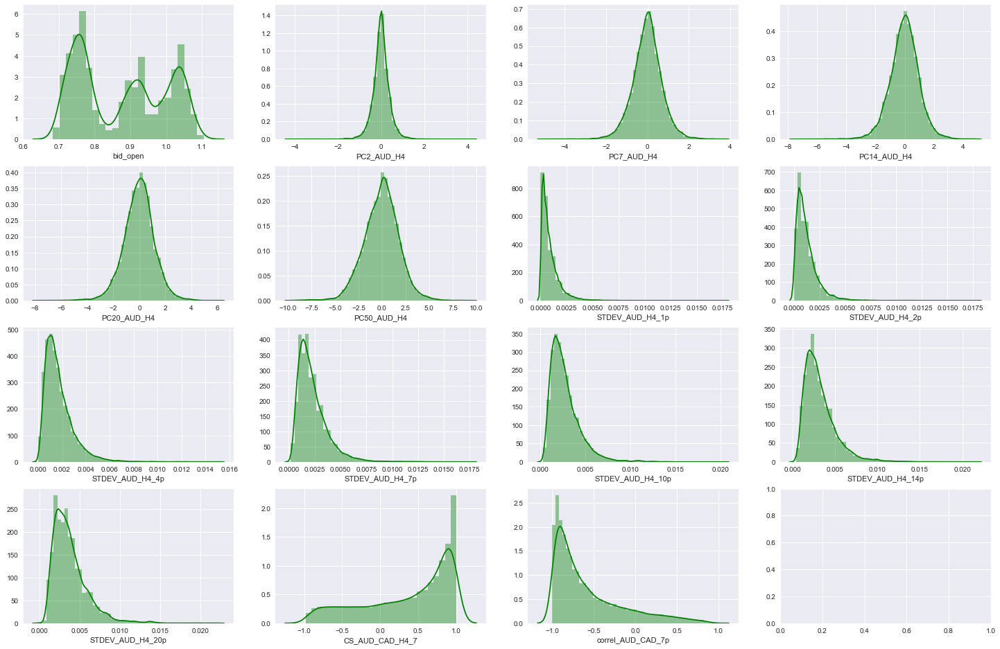

In [85]:
fig = plt.figure(figsize = (25, 25))
j = 0
for i in data.columns:
    plt.subplot(6, 4, j+1)
    j += 1
    sns.distplot(data[i], color='g')
    plt.legend(loc='best')
fig.suptitle('Data Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)
plt.show()

In [87]:
macro_economic_data=pd.read_excel(r"2007 to Jan 2019 Macro Economic Data.xlsx")

In [88]:
macro_economic_data['Currency'].unique()

array(['GBP', 'CAD', 'AUD', 'CHF', 'JPY', 'EUR', 'USD', 'CNY'],
      dtype=object)

In [89]:
macro_economic_data_AUD=macro_economic_data[(macro_economic_data['Currency']=='AUD') | (macro_economic_data['Currency']=='USD')]

In [90]:
from datetime import datetime, timedelta

In [91]:
macro_economic_data_AUD['DateTime (GMT)']=macro_economic_data_AUD['DateTime (GMT)']+timedelta(hours=4)

In [102]:
macro_economic_data_AUD_summary=macro_economic_data_AUD.groupby(['DateTime (GMT)'])['Volatility'].mean().reset_index().rename(columns={'DateTime (GMT)':'DateTime'})

In [116]:
df['time_local']=pd.to_datetime(df['time_local'])
df['time_local']=df['time_local'].dt.strftime('%Y-%m-%d %H:%M:%S')
data[['time_local','start_time_local','end_time_local']]=df[['time_local','start_time_local','end_time_local']]

In [117]:
data['time_local']=data['time_local'].astype(str)
macro_economic_data_AUD_summary['DateTime']=macro_economic_data_AUD_summary['DateTime'].astype(str)


In [118]:
df_final=pd.merge(data,macro_economic_data_AUD_summary,how='inner',left_on='time_local',right_on='DateTime')

In [119]:
df_final.head(5)

,bid_open,PC2_AUD_H4,PC7_AUD_H4,PC14_AUD_H4,PC20_AUD_H4,PC50_AUD_H4,STDEV_AUD_H4_1p,STDEV_AUD_H4_2p,STDEV_AUD_H4_4p,STDEV_AUD_H4_7p,STDEV_AUD_H4_10p,STDEV_AUD_H4_14p,STDEV_AUD_H4_20p,CS_AUD_CAD_H4_7,correl_AUD_CAD_7p,CS_AUD_CAD_H4_10,correl_AUD_CAD_10p,CS_AUD_CAD_H4_20,correl_AUD_CAD_20p,CS_AUD_CHF_H4_7,correl_AUD_CHF_7p,CS_AUD_CHF_H4_10,correl_AUD_CHF_10p,CS_AUD_CHF_H4_20,correl_AUD_CHF_20p,CS_AUD_GBP_H4_7,correl_AUD_GBP_7p,CS_AUD_GBP_H4_10,correl_AUD_GBP_10p,CS_AUD_GBP_H4_20,correl_AUD_GBP_20p,CS_AUD_JPY_H4_7,correl_AUD_JPY_7p,CS_AUD_JPY_H4_10,correl_AUD_JPY_10p,CS_AUD_JPY_H4_20,correl_AUD_JPY_20p,CS_EUR_AUD_H4_7,correl_EUR_AUD_7p,CS_EUR_AUD_H4_10,correl_EUR_AUD_10p,CS_EUR_AUD_H4_20,correl_EUR_AUD_20p,class_target1,class_target2,class_target3,PC2_AUD_H4_target1,PC2_AUD_H4_target2,PC2_AUD_H4_target3,TR_ADX_AUD1,TR_ADX_AUD2,TR_ADX_AUD3,TR_CCI_AUD1,TR_CCI_AUD2,TR_CCI_AUD3,TR_DPO_AUD1,TR_DPO_AUD2,TR_DPO_AUD4,TR_DPO_AUD6,TR_DPO_AUD8,TR_DPO_AUD10,TR_DPO_AUD12,TR_DPO_AUD14,TR_DPO_AUD16,TR_DPO_AUD18,TR_DPO_AUD20,TR_TRIX_AUD1,TR_TRIX_AUD2,TR_VI_NEG_AUD1,TR_VI_POS_AUD1,TR_VI_NEG_AUD2,TR_VI_POS_AUD2,TR_VI_NEG_AUD3,TR_VI_POS_AUD3,TR_VI_NEG_AUD4,TR_VI_POS_AUD4,TR_VI_NEG_AUD5,TR_VI_POS_AUD5,TR_VI_POS_AUD6,MOM_RSI_AUD1,MOM_RSI_AUD2,MOM_STOCH_OSCILLATOR_AUD1,MOM_STOCH_OSCILLATOR_AUD2,MOM_STOCH_OSCILLATOR_SIGNAL_AUD1,MOM_STOCH_OSCILLATOR_SIGNAL_AUD2,MOM_UO_AUD,VOL_ATR_AUD1,VOL_ATR_AUD2,VOL_BOLLINGER_BANDS_AUD1,VOL_BOLLINGER_H_BANDS_AUD1,VOL_BOLLINGER_H_BANDS_AUD2,VOL_BOLLINGER_H_BANDS_AUD3,VOL_BOLLINGER_H_BANDS_AUD4,VOL_BOLLINGER_H_BANDS_AUD5,VOL_BOLLINGER_H_BANDS_AUD6,VOL_BOLLINGER_H_BANDS_AUD7,VOL_BOLLINGER_H_BANDS_AUD8,VOL_BOLLINGER_H_BANDS_AUD9,VOL_BOLLINGER_H_BANDS_AUD10,VOL_BOLLINGER_H_BANDS_AUD11,VOL_BOLLINGER_H_BANDS_AUD12,VOL_BOLLINGER_H_BANDS_AUD13,VOL_BOLLINGER_H_BANDS_AUD14,VOL_BOLLINGER_H_BANDS_AUD15,VOL_BOLLINGER_L_BANDS_AUD1,vol_bollinger_lband_indicator1,vol_bollinger_lband_indicator2,vol_bollinger_lband_indicator3,vol_bollinger_lband_indicator4,vol_bollinger_lband_indicator5,vol_bollinger_lband_indicator6,vol_bollinger_lband_indicator7,vol_bollinger_lband_indicator8,vol_bollinger_lband_indicator9,vol_bollinger_lband_indicator10,vol_bollinger_lband_indicator11,vol_bollinger_lband_indicator12,vol_bollinger_lband_indicator13,vol_bollinger_lband_indicator14,vol_bollinger_lband_indicator15,vol_bollinger_lband_indicator16,vol_bollinger_lband_indicator19,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD1,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD4,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD5,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD1,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD3,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD4,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD1,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD2,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD3,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD4,VOL_KELTNER_CHANNEL_H_BAND_INDICATOR_AUD1,VOL_KELTNER_CHANNEL_L_BAND_INDICATOR_AUD1,year,month,day,target1,target2,target3,time_local,start_time_local,end_time_local,DateTime,Volatility
0,0.9195,0.27,-0.16,0.25,-0.30,0.22,0.0026,0.0022,0.0024,0.0024,0.0028,0.0026,0.0026,0.628,-0.729,0.853,-0.779,0.145,-0.813,-0.265,-0.745,0.685,-0.607,0.051,-0.739,0.190,-0.136,0.639,0.385,-0.206,0.349,-0.398,-0.121,0.630,-0.213,0.681,0.175,-0.166,0.668,0.618,0.541,0.481,0.619,-1.0,-1.0,-1.0,-0.205828,-0.751552,-1.004586,NaN,49.664026,47.968624,NaN,47.140452,24.443706,-0.0053,0.00015,0.000825,0.003050,0.001400,0.00233,0.003033,0.001157,-0.001863,-0.005100,-0.002975,0.576275,0.023560,0.760563,1.126761,1.089552,0.746269,1.109290,0.775956,1.120172,0.703863,1.072243,0.711027,0.714801,100.0,81.872385,95.774648,96.250000,50.745744,46.042143,49.650448,0.0071,0.006206,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,2010,1,19,0.9231,0.9181,0.9158,2010-01-19 18:00:00,1/19/2010 18:00,1/19/2010 22:00,2010-01-19 18:00:00,2.0
1,0.9249,0.37,-0.38,0.04,-0.52,-0.15,0.0009,0.0022

In [306]:

X=df_final.drop(['time_local','start_time_local','end_time_local','DateTime','year','month','day'],axis=1)


#X[X==np.inf]=np.nan

X = X.fillna(lambda x: x.mean())

obj=X.loc[:, X.dtypes =='object']
for col in obj:
    obj[col] = pd.to_numeric(obj[col], errors='coerce')
X[obj.columns]=obj


#X.replace([np.inf, -np.inf], np.nan)
#X[X==np.inf]=np.nan

X = X.fillna(99)

X=np.round(X,decimals=3)
X=X.dropna(axis=1, how='all')

X=X[X.replace([np.inf, -np.inf], np.nan).notnull().all(axis=1)]

In [307]:
X.head()

,bid_open,PC2_AUD_H4,PC7_AUD_H4,PC14_AUD_H4,PC20_AUD_H4,PC50_AUD_H4,STDEV_AUD_H4_1p,STDEV_AUD_H4_2p,STDEV_AUD_H4_4p,STDEV_AUD_H4_7p,STDEV_AUD_H4_10p,STDEV_AUD_H4_14p,STDEV_AUD_H4_20p,CS_AUD_CAD_H4_7,correl_AUD_CAD_7p,CS_AUD_CAD_H4_10,correl_AUD_CAD_10p,CS_AUD_CAD_H4_20,correl_AUD_CAD_20p,CS_AUD_CHF_H4_7,correl_AUD_CHF_7p,CS_AUD_CHF_H4_10,correl_AUD_CHF_10p,CS_AUD_CHF_H4_20,correl_AUD_CHF_20p,CS_AUD_GBP_H4_7,correl_AUD_GBP_7p,CS_AUD_GBP_H4_10,correl_AUD_GBP_10p,CS_AUD_GBP_H4_20,correl_AUD_GBP_20p,CS_AUD_JPY_H4_7,correl_AUD_JPY_7p,CS_AUD_JPY_H4_10,correl_AUD_JPY_10p,CS_AUD_JPY_H4_20,correl_AUD_JPY_20p,CS_EUR_AUD_H4_7,correl_EUR_AUD_7p,CS_EUR_AUD_H4_10,correl_EUR_AUD_10p,CS_EUR_AUD_H4_20,correl_EUR_AUD_20p,class_target1,class_target2,class_target3,PC2_AUD_H4_target1,PC2_AUD_H4_target2,PC2_AUD_H4_target3,TR_ADX_AUD1,TR_ADX_AUD2,TR_ADX_AUD3,TR_CCI_AUD1,TR_CCI_AUD2,TR_CCI_AUD3,TR_DPO_AUD1,TR_DPO_AUD2,TR_DPO_AUD4,TR_DPO_AUD6,TR_DPO_AUD8,TR_DPO_AUD10,TR_DPO_AUD12,TR_DPO_AUD14,TR_DPO_AUD16,TR_DPO_AUD18,TR_DPO_AUD20,TR_TRIX_AUD1,TR_TRIX_AUD2,TR_VI_NEG_AUD1,TR_VI_POS_AUD1,TR_VI_NEG_AUD2,TR_VI_POS_AUD2,TR_VI_NEG_AUD3,TR_VI_POS_AUD3,TR_VI_NEG_AUD4,TR_VI_POS_AUD4,TR_VI_NEG_AUD5,TR_VI_POS_AUD5,TR_VI_POS_AUD6,MOM_RSI_AUD1,MOM_RSI_AUD2,MOM_STOCH_OSCILLATOR_AUD1,MOM_STOCH_OSCILLATOR_AUD2,MOM_STOCH_OSCILLATOR_SIGNAL_AUD1,MOM_STOCH_OSCILLATOR_SIGNAL_AUD2,MOM_UO_AUD,VOL_ATR_AUD1,VOL_ATR_AUD2,VOL_BOLLINGER_BANDS_AUD1,VOL_BOLLINGER_H_BANDS_AUD1,VOL_BOLLINGER_H_BANDS_AUD2,VOL_BOLLINGER_H_BANDS_AUD3,VOL_BOLLINGER_H_BANDS_AUD4,VOL_BOLLINGER_H_BANDS_AUD5,VOL_BOLLINGER_H_BANDS_AUD6,VOL_BOLLINGER_H_BANDS_AUD7,VOL_BOLLINGER_H_BANDS_AUD8,VOL_BOLLINGER_H_BANDS_AUD9,VOL_BOLLINGER_H_BANDS_AUD10,VOL_BOLLINGER_H_BANDS_AUD11,VOL_BOLLINGER_H_BANDS_AUD12,VOL_BOLLINGER_H_BANDS_AUD13,VOL_BOLLINGER_H_BANDS_AUD14,VOL_BOLLINGER_H_BANDS_AUD15,VOL_BOLLINGER_L_BANDS_AUD1,vol_bollinger_lband_indicator1,vol_bollinger_lband_indicator2,vol_bollinger_lband_indicator3,vol_bollinger_lband_indicator4,vol_bollinger_lband_indicator5,vol_bollinger_lband_indicator6,vol_bollinger_lband_indicator7,vol_bollinger_lband_indicator8,vol_bollinger_lband_indicator9,vol_bollinger_lband_indicator10,vol_bollinger_lband_indicator11,vol_bollinger_lband_indicator12,vol_bollinger_lband_indicator13,vol_bollinger_lband_indicator14,vol_bollinger_lband_indicator15,vol_bollinger_lband_indicator16,vol_bollinger_lband_indicator19,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD1,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD4,VOL_BOLLINGER_L_BANDS_INDICATOR_AUD5,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD1,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD3,VOL_DONCHAIN_CHANNEL_H_BAND_INDICATOR_AUD4,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD1,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD2,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD3,VOL_DONCHAIN_CHANNEL_L_BAND_INDICATOR_AUD4,VOL_KELTNER_CHANNEL_H_BAND_INDICATOR_AUD1,VOL_KELTNER_CHANNEL_L_BAND_INDICATOR_AUD1,target1,target2,target3,Volatility
0,0.920,0.27,-0.16,0.25,-0.30,0.22,0.003,0.002,0.002,0.002,0.003,0.003,0.003,0.628,-0.729,0.853,-0.779,0.145,-0.813,-0.265,-0.745,0.685,-0.607,0.051,-0.739,0.190,-0.136,0.639,0.385,-0.206,0.349,-0.398,-0.121,0.630,-0.213,0.681,0.175,-0.166,0.668,0.618,0.541,0.481,0.619,-1.0,-1.0,-1.0,-0.206,-0.752,-1.005,99.0,49.664,47.969,99.0,47.14,24.444,-0.005,0.000,0.001,0.003,0.001,0.002,0.003,0.001,-0.002,-0.005,-0.003,0.576,0.024,0.761,1.127,1.090,0.746,1.109,0.776,1.120,0.704,1.072,0.711,0.715,100.0,81.872,95.775,96.250,50.746,46.042,49.650,0.007,0.006,99.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,99.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.923,0.918,0.916,2.0
1,0.925,0.37,-0.38,0.04,-0.52,-0.15,0.001,0.002,0.002,0.002,0.002,0.002,0.002,0.230,-0.693,0.551,-0.693,0.224,-0.769,-0.509,-0.735,0.112,-0.676,0.195,-0.607,0.140,0.065,0.799,0.063,-0.249,0.384,-0.643,-0.195,0.238,-0.322,0.747,0.070,-0.388,0.656,0.189,0.552,0.593,0.517,-1.0,-1.0,-1.0,-0.545,-0.797,-1.062,99.0,32.192,

In [308]:
X.dtypes

bid_open                                      float64
PC2_AUD_H4                                    float64
PC7_AUD_H4                                    float64
PC14_AUD_H4                                   float64
PC20_AUD_H4                                   float64
PC50_AUD_H4                                   float64
STDEV_AUD_H4_1p                               float64
STDEV_AUD_H4_2p                               float64
STDEV_AUD_H4_4p                               float64
STDEV_AUD_H4_7p                               float64
STDEV_AUD_H4_10p                              float64
STDEV_AUD_H4_14p                              float64
STDEV_AUD_H4_20p                              float64
CS_AUD_CAD_H4_7                               float64
correl_AUD_CAD_7p                             float64
CS_AUD_CAD_H4_10                              float64
correl_AUD_CAD_10p                            float64
CS_AUD_CAD_H4_20                              float64
correl_AUD_CAD_20p          

In [309]:
X.isna().any()

bid_open                                      False
PC2_AUD_H4                                    False
PC7_AUD_H4                                    False
PC14_AUD_H4                                   False
PC20_AUD_H4                                   False
PC50_AUD_H4                                   False
STDEV_AUD_H4_1p                               False
STDEV_AUD_H4_2p                               False
STDEV_AUD_H4_4p                               False
STDEV_AUD_H4_7p                               False
STDEV_AUD_H4_10p                              False
STDEV_AUD_H4_14p                              False
STDEV_AUD_H4_20p                              False
CS_AUD_CAD_H4_7                               False
correl_AUD_CAD_7p                             False
CS_AUD_CAD_H4_10                              False
correl_AUD_CAD_10p                            False
CS_AUD_CAD_H4_20                              False
correl_AUD_CAD_20p                            False
CS_AUD_CHF_H

In [310]:
y=X['PC2_AUD_H4']
X=X.drop(['PC2_AUD_H4'],axis=1)

In [312]:
from sklearn import linear_model
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Ridge
clf = linear_model.Lasso()

clf.fit(X,y)

print(clf.coef_)

[-0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.         -0.          0.         -0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
 -0.         -0.         -0.         -0.          0.         -0.
  0.          0.          0.          0.          0.          0.
 -0.         -0.          0.         -0.         -0.         -0.
  0.          0.          0.          0.          0.          0.00313575
 -0.         -0.         -0.         -0.         -0.         -0.
 -0.         -0.         -0.         -0.         -0.          0.
  0.         -0.          0.         -0.          0.         -0.
  0.         -0.          0.         -0.          0.          0.
 -0.          0.00144548  0.          0.00350064  0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0. 

In [319]:
coef_dict = {}
for coef, feat in zip(clf.coef_, X.columns):
    coef_dict[feat] = coef
coef_dict


{'bid_open': -0.0,
 'PC7_AUD_H4': 0.0,
 'PC14_AUD_H4': 0.0,
 'PC20_AUD_H4': 0.0,
 'PC50_AUD_H4': 0.0,
 'STDEV_AUD_H4_1p': 0.0,
 'STDEV_AUD_H4_2p': 0.0,
 'STDEV_AUD_H4_4p': 0.0,
 'STDEV_AUD_H4_7p': 0.0,
 'STDEV_AUD_H4_10p': 0.0,
 'STDEV_AUD_H4_14p': 0.0,
 'STDEV_AUD_H4_20p': 0.0,
 'CS_AUD_CAD_H4_7': 0.0,
 'correl_AUD_CAD_7p': 0.0,
 'CS_AUD_CAD_H4_10': -0.0,
 'correl_AUD_CAD_10p': 0.0,
 'CS_AUD_CAD_H4_20': -0.0,
 'correl_AUD_CAD_20p': 0.0,
 'CS_AUD_CHF_H4_7': 0.0,
 'correl_AUD_CHF_7p': 0.0,
 'CS_AUD_CHF_H4_10': 0.0,
 'correl_AUD_CHF_10p': 0.0,
 'CS_AUD_CHF_H4_20': 0.0,
 'correl_AUD_CHF_20p': 0.0,
 'CS_AUD_GBP_H4_7': 0.0,
 'correl_AUD_GBP_7p': 0.0,
 'CS_AUD_GBP_H4_10': 0.0,
 'correl_AUD_GBP_10p': 0.0,
 'CS_AUD_GBP_H4_20': 0.0,
 'correl_AUD_GBP_20p': 0.0,
 'CS_AUD_JPY_H4_7': -0.0,
 'correl_AUD_JPY_7p': -0.0,
 'CS_AUD_JPY_H4_10': -0.0,
 'correl_AUD_JPY_10p': -0.0,
 'CS_AUD_JPY_H4_20': 0.0,
 'correl_AUD_JPY_20p': -0.0,
 'CS_EUR_AUD_H4_7': 0.0,
 'correl_EUR_AUD_7p': 0.0,
 'CS_EUR_AUD_H4_10': 

In [323]:
li=[k for k,v in coef_dict.items() if v >0]
li

['TR_CCI_AUD3', 'MOM_RSI_AUD2', 'MOM_STOCH_OSCILLATOR_AUD2']

In [324]:
X_vif=X[li]

In [325]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
#X =X[X.replace([np.inf, -np.inf], np.nan).notnull().all(axis=1)]
#X=X.fillna(0)
X_vif = add_constant(X_vif)
vif= pd.Series([variance_inflation_factor(X_vif.values, i) 
               for i in range(X_vif.shape[1])], 
              index=X_vif.columns)

In [326]:
vif

const                        10.235835
TR_CCI_AUD3                   3.698655
MOM_RSI_AUD2                  6.384981
MOM_STOCH_OSCILLATOR_AUD2     4.040054
dtype: float64